This notebook has some package requirements, which may not be present on your machine:
- `pyarrow`/`fastparquet`,
- `plotly`,
- `seaborn`.

Install them first using your package manager (`conda`/`pip`).

In [1]:
%pylab inline
plt.style.use("bmh")
plt.rcParams["figure.figsize"] = (12,4)

Populating the interactive namespace from numpy and matplotlib


In [2]:
# Generic imports
import pathlib

# Plotting imports
import seaborn as sns

# DS imports
import numpy as np
import pandas as pd

# Constants

Put downloaded data files into `data` directory alongside the notebook, or change `DATA_DIR`.

In [3]:
DATA_DIR = pathlib.Path("./data")
TELEMETRY_FNAME = "telemetry.parquet"
WEATHER_FNAME = "weather.parquet"

# Loading data

In [4]:
telemetry = pd.read_parquet(DATA_DIR.joinpath(TELEMETRY_FNAME))
weather = pd.read_parquet(DATA_DIR.joinpath(WEATHER_FNAME))

In [5]:
telemetry.head()

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,28,3.496503,1559.487952
2022-11-09 00:00:03,28,3.496503,1564.307229
2022-11-09 00:00:04,31,3.496503,1568.825301
2022-11-09 00:00:05,31,3.496503,1483.885542
2022-11-09 00:00:09,28,2.797203,1542.469880


In [6]:
weather.head()

,temp,humidity,snow,rain
timestamp,,,,
2022-11-09 00:07:19,4.52,81,0.0,0.0
2022-11-09 00:22:30,4.52,81,0.0,0.0
2022-11-09 00:37:30,4.79,81,0.0,0.0
2022-11-09 00:52:30,4.79,81,0.0,0.0
2022-11-09 01:07:30,4.79,81,0.0,0.0


# `DatetimeIndex`

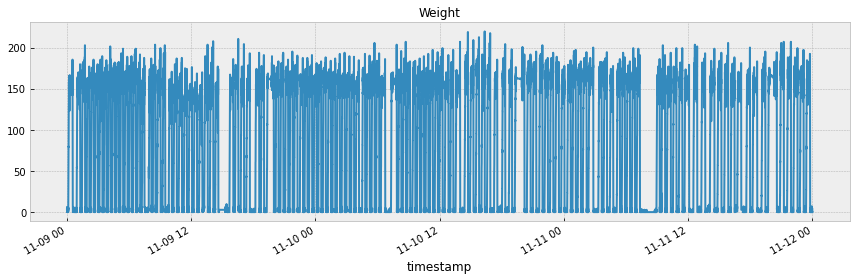

In [7]:
telemetry["weight"].plot()
plt.title("Weight", fontsize=12)
plt.tight_layout()

In [8]:
telemetry.head(15)

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,28,3.496503,1559.487952
2022-11-09 00:00:03,28,3.496503,1564.307229
2022-11-09 00:00:04,31,3.496503,1568.825301
2022-11-09 00:00:05,31,3.496503,1483.885542
2022-11-09 00:00:09,28,2.797203,1542.469880
2022-11-09 00:00:12,25,4.895105,1376.656627
2022-11-09 00:00:17,23,2.797203,872.891566
2022-11-09 00:00:22,23,0.699301,1177.560241
2022-11-09 00:00:26,24,2.797203,967.018072


In [9]:
telemetry.index

DatetimeIndex(['2022-11-09 00:00:00', '2022-11-09 00:00:03',
               '2022-11-09 00:00:04', '2022-11-09 00:00:05',
               '2022-11-09 00:00:09', '2022-11-09 00:00:12',
               '2022-11-09 00:00:17', '2022-11-09 00:00:22',
               '2022-11-09 00:00:26', '2022-11-09 00:00:28',
               ...
               '2022-11-11 23:59:15', '2022-11-11 23:59:16',
               '2022-11-11 23:59:21', '2022-11-11 23:59:26',
               '2022-11-11 23:59:31', '2022-11-11 23:59:36',
               '2022-11-11 23:59:41', '2022-11-11 23:59:46',
               '2022-11-11 23:59:51', '2022-11-11 23:59:56'],
              dtype='datetime64[ns]', name='timestamp', length=65887, freq=None)

`DatetimeIndex` indexes allows for flexible indexing:

In [10]:
telemetry.loc["2022-11-09"]

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,28,3.496503,1559.487952
2022-11-09 00:00:03,28,3.496503,1564.307229
2022-11-09 00:00:04,31,3.496503,1568.825301
2022-11-09 00:00:05,31,3.496503,1483.885542
2022-11-09 00:00:09,28,2.797203,1542.469880
...,...,...,...
2022-11-09 23:59:37,20,151.748252,2180.421687
2022-11-09 23:59:42,20,152.447552,2178.614458
2022-11-09 23:59:47,19,153.846154,2178.162651


In [11]:
telemetry.loc["2022-11-09 13"]

,speed,weight,turn
timestamp,,,
2022-11-09 13:00:04,33,152.447552,1267.771084
2022-11-09 13:00:09,33,115.384615,1210.843373
2022-11-09 13:00:14,31,125.174825,1413.855422
2022-11-09 13:00:19,31,125.174825,1455.873494
2022-11-09 13:00:24,32,132.167832,1218.222892
...,...,...,...
2022-11-09 13:59:37,9,162.237762,2178.162651
2022-11-09 13:59:42,9,163.636364,2180.873494
2022-11-09 13:59:47,10,165.734266,2178.614458


In [12]:
telemetry.loc["2022-11-09 13":"2022-11-09 13:45"]

,speed,weight,turn
timestamp,,,
2022-11-09 13:00:04,33,152.447552,1267.771084
2022-11-09 13:00:09,33,115.384615,1210.843373
2022-11-09 13:00:14,31,125.174825,1413.855422
2022-11-09 13:00:19,31,125.174825,1455.873494
2022-11-09 13:00:24,32,132.167832,1218.222892
...,...,...,...
2022-11-09 13:45:38,0,0.000000,966.716867
2022-11-09 13:45:43,0,0.000000,962.349398
2022-11-09 13:45:48,0,0.000000,960.692771


Note, that indexing is *inclusive*. Plotting is ready to go as well (Pandas):

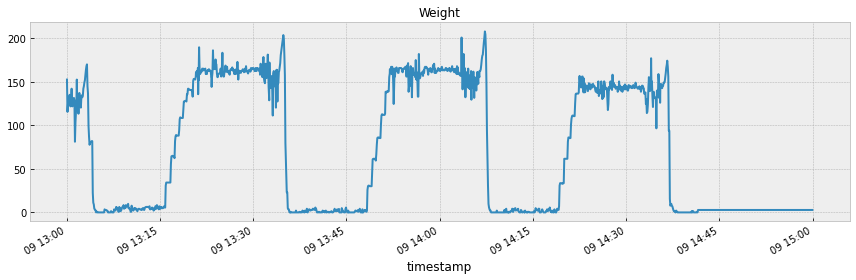

In [13]:
telemetry["weight"].loc["2022-11-09 13": "2022-11-09 14"].plot()
plt.title("Weight", fontsize=12)
plt.tight_layout()

# Resampling

The index is not evenly spaced:

In [14]:
telemetry.index

DatetimeIndex(['2022-11-09 00:00:00', '2022-11-09 00:00:03',
               '2022-11-09 00:00:04', '2022-11-09 00:00:05',
               '2022-11-09 00:00:09', '2022-11-09 00:00:12',
               '2022-11-09 00:00:17', '2022-11-09 00:00:22',
               '2022-11-09 00:00:26', '2022-11-09 00:00:28',
               ...
               '2022-11-11 23:59:15', '2022-11-11 23:59:16',
               '2022-11-11 23:59:21', '2022-11-11 23:59:26',
               '2022-11-11 23:59:31', '2022-11-11 23:59:36',
               '2022-11-11 23:59:41', '2022-11-11 23:59:46',
               '2022-11-11 23:59:51', '2022-11-11 23:59:56'],
              dtype='datetime64[ns]', name='timestamp', length=65887, freq=None)

In [15]:
telemetry.resample("5S").mean()

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,29.0,3.496503,1564.206827
2022-11-09 00:00:05,29.5,3.146853,1513.177711
2022-11-09 00:00:10,25.0,4.895105,1376.656627
2022-11-09 00:00:15,23.0,2.797203,872.891566
2022-11-09 00:00:20,23.0,0.699301,1177.560241
...,...,...,...
2022-11-11 23:59:35,0.0,0.000000,965.512048
2022-11-11 23:59:40,0.0,0.000000,961.897590
2022-11-11 23:59:45,0.0,0.000000,968.222892


You can use `telemetry.resample("5S", on=<datetime column>)` as well.

In [16]:
telemetry = telemetry.resample("5S").mean()

In [17]:
telemetry.head()

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,29.0,3.496503,1564.206827
2022-11-09 00:00:05,29.5,3.146853,1513.177711
2022-11-09 00:00:10,25.0,4.895105,1376.656627
2022-11-09 00:00:15,23.0,2.797203,872.891566
2022-11-09 00:00:20,23.0,0.699301,1177.560241


Note, the index now has frequency:

In [18]:
telemetry.index

DatetimeIndex(['2022-11-09 00:00:00', '2022-11-09 00:00:05',
               '2022-11-09 00:00:10', '2022-11-09 00:00:15',
               '2022-11-09 00:00:20', '2022-11-09 00:00:25',
               '2022-11-09 00:00:30', '2022-11-09 00:00:35',
               '2022-11-09 00:00:40', '2022-11-09 00:00:45',
               ...
               '2022-11-11 23:59:10', '2022-11-11 23:59:15',
               '2022-11-11 23:59:20', '2022-11-11 23:59:25',
               '2022-11-11 23:59:30', '2022-11-11 23:59:35',
               '2022-11-11 23:59:40', '2022-11-11 23:59:45',
               '2022-11-11 23:59:50', '2022-11-11 23:59:55'],
              dtype='datetime64[ns]', name='timestamp', length=51840, freq='5S')

# Rolling windows

We often need rolling windows operations. Pandas provides them out of the box:

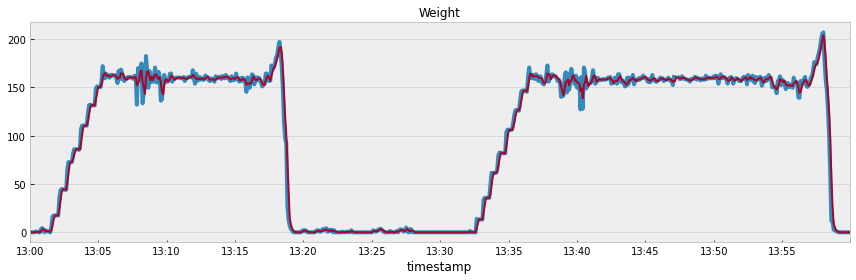

In [19]:
telemetry["weight"].loc["2022-11-10 13"].plot(linewidth=4)
telemetry["weight"].rolling("15S").mean().loc["2022-11-10 13"].plot()
plt.title("Weight", fontsize=12)
plt.tight_layout()

It works very similar to `groupby`:

In [20]:
telemetry["weight"].rolling("15S")

Rolling [window=15000000000,min_periods=1,center=False,win_type=freq,axis=0]

In [21]:
telemetry["weight"].rolling("15S").mean()

timestamp
2022-11-09 00:00:00    3.496503
2022-11-09 00:00:05    3.321678
2022-11-09 00:00:10    3.846154
2022-11-09 00:00:15    3.613054
2022-11-09 00:00:20    2.797203
                         ...   
2022-11-11 23:59:35    0.000000
2022-11-11 23:59:40    0.000000
2022-11-11 23:59:45    0.000000
2022-11-11 23:59:50    0.000000
2022-11-11 23:59:55    0.000000
Freq: 5S, Name: weight, Length: 51840, dtype: float64

# Calculating time series features

In [22]:
df = telemetry.rolling("90S").mean()

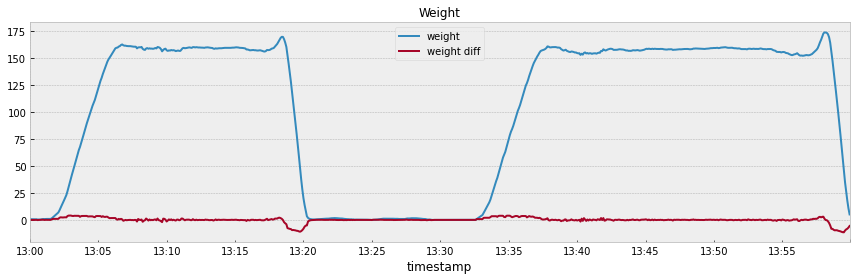

In [23]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
df["weight"].diff().loc["2022-11-10 13"].plot(label="weight diff")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

`df["weight"].diff()` is trivial, as well as, say, `df.rolling("15S").std()`. Let's do some trickery:

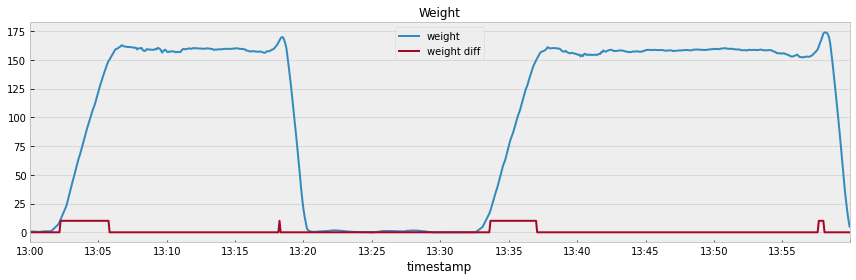

In [24]:
mask = (df["weight"].diff() > 2).astype(int)

df["weight"].loc["2022-11-10 13"].plot(label="weight")
(mask * 10).loc["2022-11-10 13"].plot(label="weight diff")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

Remember zero-crossings? We can calculate smth. similar, but more flexible:

In [25]:
(df["weight"].diff() > 2).rolling("60S").mean()

timestamp
2022-11-09 00:00:00    0.0
2022-11-09 00:00:05    0.0
2022-11-09 00:00:10    0.0
2022-11-09 00:00:15    0.0
2022-11-09 00:00:20    0.0
                      ... 
2022-11-11 23:59:35    0.0
2022-11-11 23:59:40    0.0
2022-11-11 23:59:45    0.0
2022-11-11 23:59:50    0.0
2022-11-11 23:59:55    0.0
Freq: 5S, Name: weight, Length: 51840, dtype: float64

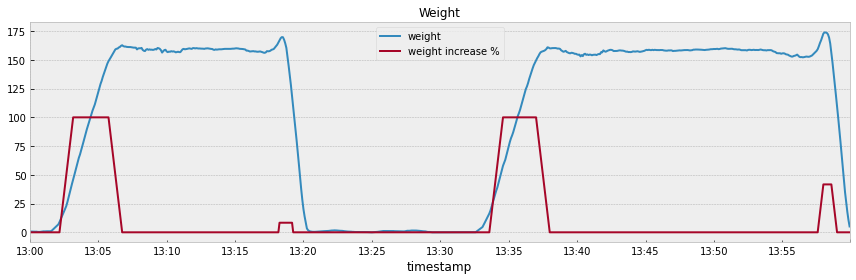

In [26]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
((df["weight"].diff() > 2).rolling("60S").mean() * 100).loc["2022-11-10 13"].plot(label="weight increase %")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

In [27]:
(df["weight"].diff() < -5).rolling("60S").mean()

timestamp
2022-11-09 00:00:00    0.0
2022-11-09 00:00:05    0.0
2022-11-09 00:00:10    0.0
2022-11-09 00:00:15    0.0
2022-11-09 00:00:20    0.0
                      ... 
2022-11-11 23:59:35    0.0
2022-11-11 23:59:40    0.0
2022-11-11 23:59:45    0.0
2022-11-11 23:59:50    0.0
2022-11-11 23:59:55    0.0
Freq: 5S, Name: weight, Length: 51840, dtype: float64

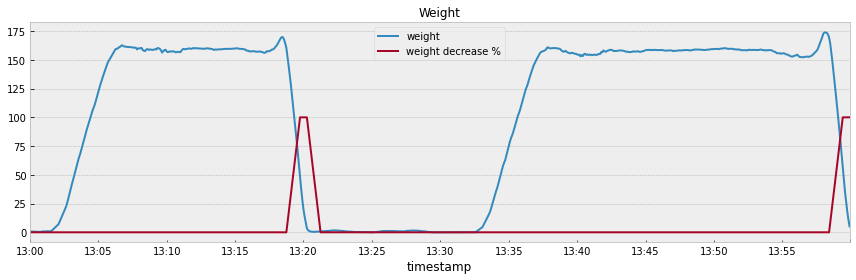

In [28]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
((df["weight"].diff() < -5).rolling("60S").mean() * 100).loc["2022-11-10 13"].plot(label="weight decrease %")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

## Actual zero-crossings

In [29]:
df.weight.diff()

timestamp
2022-11-09 00:00:00         NaN
2022-11-09 00:00:05   -0.174825
2022-11-09 00:00:10    0.524476
2022-11-09 00:00:15   -0.262238
2022-11-09 00:00:20   -0.576923
                         ...   
2022-11-11 23:59:35   -0.023310
2022-11-11 23:59:40    0.000000
2022-11-11 23:59:45   -0.186480
2022-11-11 23:59:50   -0.139860
2022-11-11 23:59:55   -0.016754
Freq: 5S, Name: weight, Length: 51840, dtype: float64

In [30]:
(df.weight.diff() > 2).astype(int).diff().loc["2022-11-10 13"]

timestamp
2022-11-10 13:00:00    0.0
2022-11-10 13:00:05    0.0
2022-11-10 13:00:10    0.0
2022-11-10 13:00:15    0.0
2022-11-10 13:00:20    0.0
                      ... 
2022-11-10 13:59:35    0.0
2022-11-10 13:59:40    0.0
2022-11-10 13:59:45    0.0
2022-11-10 13:59:50    0.0
2022-11-10 13:59:55    0.0
Freq: 5S, Name: weight, Length: 720, dtype: float64

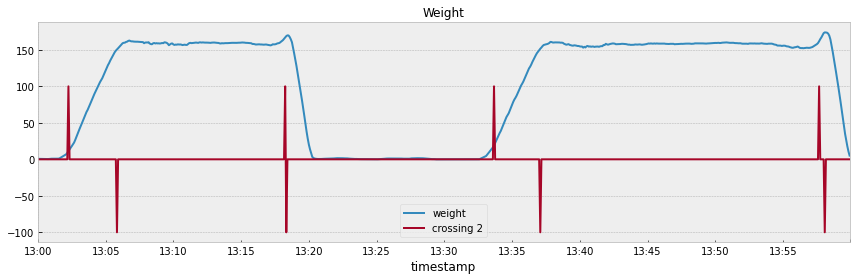

In [31]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
((df.weight.diff() > 2).astype(int).diff() * 100).loc["2022-11-10 13"].plot(label="crossing 2")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

Crossing from `< 2` to `> 2`:

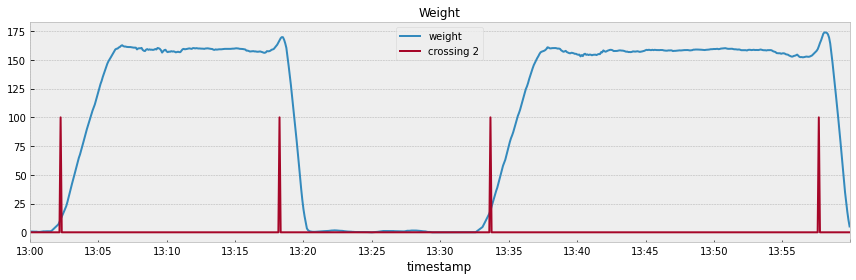

In [32]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
((df.weight.diff() > 2).astype(int).diff().clip(0, 1) * 100).loc["2022-11-10 13"].plot(label="crossing 2")

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

Windowed number of crossings:

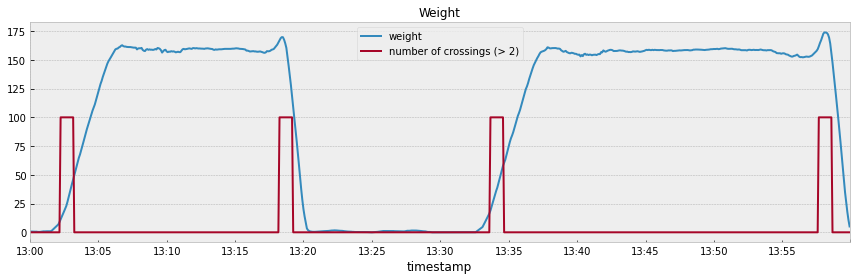

In [33]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
(((df.weight.diff() > 2)
  .astype(int)
  .diff()
  .clip(0, 1)
  .rolling("60S")
  .sum() * 100).loc["2022-11-10 13"].plot(label="number of crossings (> 2)"))

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

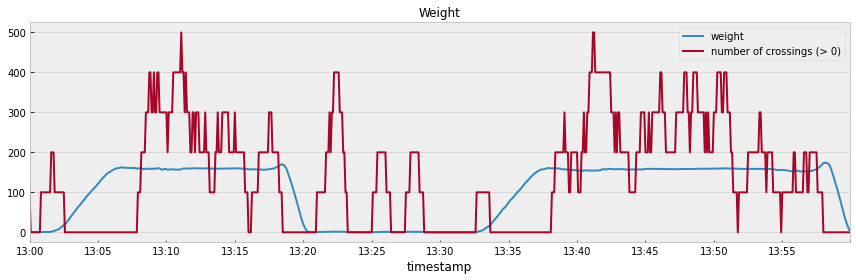

In [34]:
df["weight"].loc["2022-11-10 13"].plot(label="weight")
(((df.weight.diff() > 0.1)
  .astype(int)
  .diff()
  .clip(0, 1)
  .rolling("60S")
  .sum() * 100).loc["2022-11-10 13"].plot(label="number of crossings (> 0)"))

plt.legend(loc=0)

plt.title("Weight", fontsize=12)
plt.tight_layout()

# Clustering

In [35]:
import plotly.express as px

In [36]:
df["weight_diff"] = df.weight.diff()

<AxesSubplot:xlabel='weight', ylabel='weight_diff'>

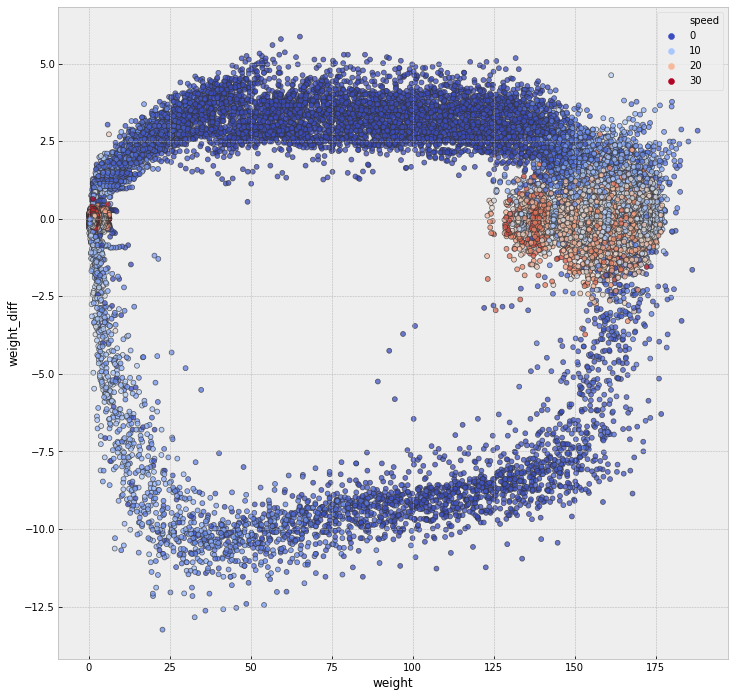

In [37]:
plt.figure(figsize=(12,12))

sns.scatterplot(x="weight", y="weight_diff",
                hue="speed",
                palette=plt.cm.coolwarm,
                data=df, s=24, hue_norm=(0, 30), edgecolor="0.2", alpha=0.75)

In [38]:
df["weight_scaled"] = df["weight"] / 175
df["weight_diff_scaled"] = (df["weight_diff"] + 12.5) / 17.5
df["speed_scaled"] = df["speed"] / 40
df["turn_scaled"] = (df["turn"] - 950) / 1250

In [39]:
df

,speed,weight,turn,weight_diff,weight_scaled,weight_diff_scaled,speed_scaled,turn_scaled
timestamp,,,,,,,,
2022-11-09 00:00:00,29.000000,3.496503,1564.206827,NaN,0.019980,NaN,0.725000,0.491365
2022-11-09 00:00:05,29.250000,3.321678,1538.692269,-0.174825,0.018981,0.704296,0.731250,0.470954
2022-11-09 00:00:10,27.833333,3.846154,1484.680388,0.524476,0.021978,0.744256,0.695833,0.427744
2022-11-09 00:00:15,26.625000,3.583916,1331.733183,-0.262238,0.020480,0.699301,0.665625,0.305387
2022-11-09 00:00:20,25.900000,3.006993,1300.898594,-0.576923,0.017183,0.681319,0.647500,0.280719
...,...,...,...,...,...,...,...,...
2022-11-11 23:59:35,9.883333,0.594406,1101.880020,-0.023310,0.003397,0.712954,0.247083,0.121504
2022-11-11 23:59:40,7.950000,0.594406,1101.548695,0.000000,0.003397,0.714286,0.198750,0.121239
2022-11-11 23:59:45,6.683333,0.407925,1075.082831,-0.186480,0.002331,0.703630,0.167083,0.100066


In [40]:
fig = px.scatter_3d(df.sample(15000), x="weight", y="weight_diff", z='speed',
                    color="turn",
                    size=np.ones(15000) / 10, size_max=4, width=800, height=800, range_color=(950, 2200))
fig.show()

In [41]:
fig = px.scatter_3d(df.sample(15000), x="weight", y="weight_diff", z='turn',
                    color="speed",
                    size=np.ones(15000) / 10, size_max=4, width=800, height=800, range_color=(0, 30),
                    range_z=(950, 2200))
fig.show()

Looks tricky for clustering, but we'll try.

## DBSCAN

In [42]:
from sklearn.cluster import DBSCAN

In [43]:
cluster = DBSCAN(eps=0.01)

In [44]:
COLS = ['weight_scaled', 'weight_diff_scaled', 'speed_scaled']

In [45]:
labels = cluster.fit_predict(df[COLS].fillna(0))

In [46]:
df["labels"] = labels

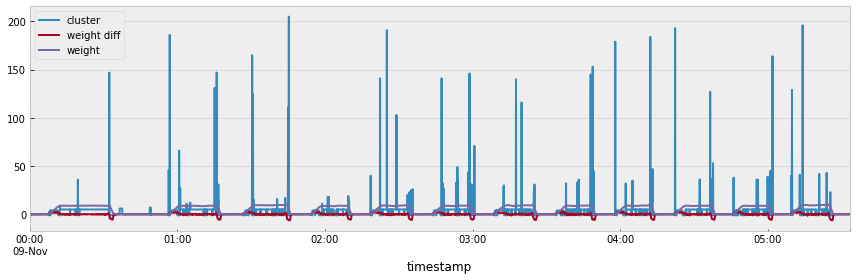

In [47]:
df["labels"].iloc[:4000].plot(label="cluster")
(df["weight_scaled"].diff().iloc[:4000] * 100).plot(label="weight diff")
(df["weight_scaled"].iloc[:4000] * 10).plot(label="weight")

plt.legend(loc=0)

plt.tight_layout()

In [48]:
TOP_K = 15

pd.Series(labels).value_counts().head(TOP_K)

 0      19673
 5      16450
-1       7708
 4       4819
 107      901
 13       222
 136      163
 1        101
 56        76
 23        53
 14        46
 70        41
 57        36
 12        36
 68        32
dtype: int64

In [49]:
df.loc[~df.labels.isin(pd.Series(labels).value_counts().head(TOP_K).index), "labels"] = np.nan
df.loc[df.labels==-1, "labels"] = np.nan

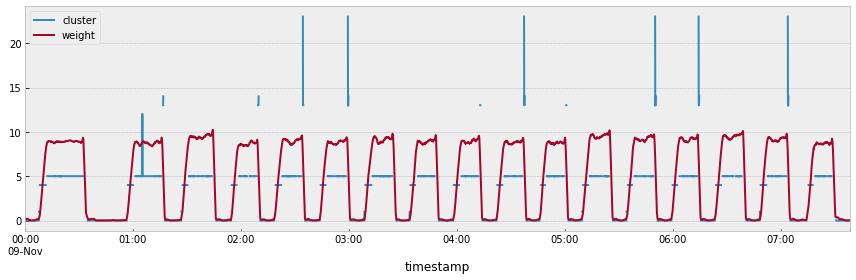

In [50]:
df["labels"].iloc[:5500].plot(label="cluster")
(df["weight_scaled"].iloc[:5500] * 10).plot(label="weight")
# (df["speed_scaled"].iloc[:5500] * 10).plot(label="weight")

plt.legend(loc=0)

plt.tight_layout()

# Bonus

In [51]:
telemetry

,speed,weight,turn
timestamp,,,
2022-11-09 00:00:00,29.0,3.496503,1564.206827
2022-11-09 00:00:05,29.5,3.146853,1513.177711
2022-11-09 00:00:10,25.0,4.895105,1376.656627
2022-11-09 00:00:15,23.0,2.797203,872.891566
2022-11-09 00:00:20,23.0,0.699301,1177.560241
...,...,...,...
2022-11-11 23:59:35,0.0,0.000000,965.512048
2022-11-11 23:59:40,0.0,0.000000,961.897590
2022-11-11 23:59:45,0.0,0.000000,968.222892


In [52]:
weather

,temp,humidity,snow,rain
timestamp,,,,
2022-11-09 00:07:19,4.52,81,0.0,0.0
2022-11-09 00:22:30,4.52,81,0.0,0.0
2022-11-09 00:37:30,4.79,81,0.0,0.0
2022-11-09 00:52:30,4.79,81,0.0,0.0
2022-11-09 01:07:30,4.79,81,0.0,0.0
...,...,...,...,...
2022-11-11 22:52:56,3.12,77,0.0,0.0
2022-11-11 23:07:56,3.17,76,0.0,0.0
2022-11-11 23:22:56,3.17,76,0.0,0.0


How to merge weather to telemetry? First, resample weather to smth:

In [53]:
weather.resample("15T").mean()

,temp,humidity,snow,rain
timestamp,,,,
2022-11-09 00:00:00,4.52,81,0.0,0.0
2022-11-09 00:15:00,4.52,81,0.0,0.0
2022-11-09 00:30:00,4.79,81,0.0,0.0
2022-11-09 00:45:00,4.79,81,0.0,0.0
2022-11-09 01:00:00,4.79,81,0.0,0.0
...,...,...,...,...
2022-11-11 22:45:00,3.12,77,0.0,0.0
2022-11-11 23:00:00,3.17,76,0.0,0.0
2022-11-11 23:15:00,3.17,76,0.0,0.0


Second, get the same frequency in telemetry:

In [54]:
telemetry.index.floor("15T")

DatetimeIndex(['2022-11-09 00:00:00', '2022-11-09 00:00:00',
               '2022-11-09 00:00:00', '2022-11-09 00:00:00',
               '2022-11-09 00:00:00', '2022-11-09 00:00:00',
               '2022-11-09 00:00:00', '2022-11-09 00:00:00',
               '2022-11-09 00:00:00', '2022-11-09 00:00:00',
               ...
               '2022-11-11 23:45:00', '2022-11-11 23:45:00',
               '2022-11-11 23:45:00', '2022-11-11 23:45:00',
               '2022-11-11 23:45:00', '2022-11-11 23:45:00',
               '2022-11-11 23:45:00', '2022-11-11 23:45:00',
               '2022-11-11 23:45:00', '2022-11-11 23:45:00'],
              dtype='datetime64[ns]', name='timestamp', length=51840, freq=None)

In [55]:
telemetry.index.floor("15T").to_series()

timestamp
2022-11-09 00:00:00   2022-11-09 00:00:00
2022-11-09 00:00:00   2022-11-09 00:00:00
2022-11-09 00:00:00   2022-11-09 00:00:00
2022-11-09 00:00:00   2022-11-09 00:00:00
2022-11-09 00:00:00   2022-11-09 00:00:00
                              ...        
2022-11-11 23:45:00   2022-11-11 23:45:00
2022-11-11 23:45:00   2022-11-11 23:45:00
2022-11-11 23:45:00   2022-11-11 23:45:00
2022-11-11 23:45:00   2022-11-11 23:45:00
2022-11-11 23:45:00   2022-11-11 23:45:00
Name: timestamp, Length: 51840, dtype: datetime64[ns]

In [56]:
telemetry["merge_key"] = telemetry.index.floor("15T").to_series().values

In [57]:
telemetry

,speed,weight,turn,merge_key
timestamp,,,,
2022-11-09 00:00:00,29.0,3.496503,1564.206827,2022-11-09 00:00:00
2022-11-09 00:00:05,29.5,3.146853,1513.177711,2022-11-09 00:00:00
2022-11-09 00:00:10,25.0,4.895105,1376.656627,2022-11-09 00:00:00
2022-11-09 00:00:15,23.0,2.797203,872.891566,2022-11-09 00:00:00
2022-11-09 00:00:20,23.0,0.699301,1177.560241,2022-11-09 00:00:00
...,...,...,...,...
2022-11-11 23:59:35,0.0,0.000000,965.512048,2022-11-11 23:45:00
2022-11-11 23:59:40,0.0,0.000000,961.897590,2022-11-11 23:45:00
2022-11-11 23:59:45,0.0,0.000000,968.222892,2022-11-11 23:45:00


Merge!

In [58]:
telemetry.merge(weather.resample("15T").mean(),
                left_on="merge_key",
                right_index=True,
                how="left")

,speed,weight,turn,merge_key,temp,humidity,snow,rain
timestamp,,,,,,,,
2022-11-09 00:00:00,29.0,3.496503,1564.206827,2022-11-09 00:00:00,4.52,81,0.0,0.0
2022-11-09 00:00:05,29.5,3.146853,1513.177711,2022-11-09 00:00:00,4.52,81,0.0,0.0
2022-11-09 00:00:10,25.0,4.895105,1376.656627,2022-11-09 00:00:00,4.52,81,0.0,0.0
2022-11-09 00:00:15,23.0,2.797203,872.891566,2022-11-09 00:00:00,4.52,81,0.0,0.0
2022-11-09 00:00:20,23.0,0.699301,1177.560241,2022-11-09 00:00:00,4.52,81,0.0,0.0
...,...,...,...,...,...,...,...,...
2022-11-11 23:59:35,0.0,0.000000,965.512048,2022-11-11 23:45:00,2.84,79,0.0,0.0
2022-11-11 23:59:40,0.0,0.000000,961.897590,2022-11-11 23:45:00,2.84,79,0.0,0.0
2022-11-11 23:59:45,0.0,0.000000,968.222892,2022-11-11 23:45:00,2.84,79,0.0,0.0
